In [58]:
import pandas as pd
import sqlite3
import seaborn as sns

# Read sqlite query results into a pandas DataFrame
def query(query):
    con = sqlite3.connect("output/portfolios.sqlite")
    df = pd.read_sql_query(query, con)
    con.close()
    return df

In [61]:
# Repeat the exercise of drilling down to the best portfolios,
# But starting from a reduced set of assets.
#
# Going to eliminate:
#  - All bonds, except short term treasuries (T-Bill, STT, TIPS)
#  - Actively managed funds, like Health Care, Wellington

not_bonds = """
       INSTR(assets, '|LT STRIPS|') == 0
   AND INSTR(assets, '|LTT|') == 0
   AND INSTR(assets, '|IT Corp|') == 0
   AND INSTR(assets, '|ITB|') == 0
   AND INSTR(assets, '|ITT|') == 0
   AND INSTR(assets, '|TBM|') == 0
   AND INSTR(assets, '|STB|') == 0
   AND INSTR(assets, '|IT Munis|') == 0
   AND INSTR(assets, '|LT Munis|') == 0
   AND INSTR(assets, '|ST Munis|') == 0
   AND INSTR(assets, '|ST Invest. Grade|') == 0
   AND INSTR(assets, '|Hi-Yield Corp Bd|') == 0
   AND INSTR(assets, '|Int''l Bd|') == 0
   AND INSTR(assets, '|Global Bd|') == 0
"""
not_active_mananged = """
       INSTR(assets, '|Energy|') == 0
   AND INSTR(assets, '|Health Care|') == 0
   AND INSTR(assets, '|Wellington|') == 0
   AND INSTR(assets, '|Wellesley|') == 0
   AND INSTR(assets, '|Windsor|') == 0
   AND INSTR(assets, '|Windsor II|') == 0
"""
exclude_assets = not_bonds+' AND '+not_active_mananged

# Create a trimmed down portfolios table, eliminating those assets
con = sqlite3.connect("output/portfolios.sqlite")
cur = con.cursor()
cur.execute("""
    CREATE TABLE portfolios_no_bonds_no_active_funds AS
    SELECT * FROM portfolios
    WHERE """+exclude_assets+"""
""")
con.commit()
con.close()

p1 = query("SELECT COUNT(*) AS c FROM portfolios")['c'][0]
print("portfolios:", p1)

p2 = query("SELECT COUNT(*) AS c FROM portfolios_no_bonds_no_active_funds")['c'][0]
print("after exlusions:", p2, "(",p2/p1*100,"%)")

portfolios: 3187367
after exlusions: 284273 ( 8.918740766281385 %)


6017


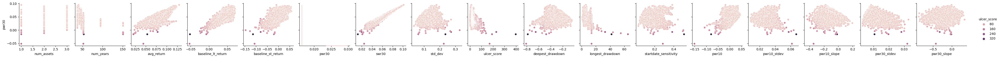

In [63]:
# start with just 3 asset portfolios, to get a sense of the shape of the graphs
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

5395


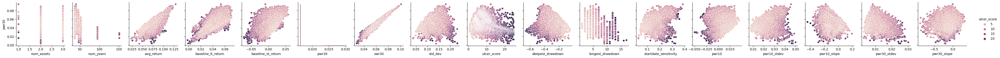

In [65]:
# tighten: ulcer score
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
    AND ulcer_score < 25
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

3420


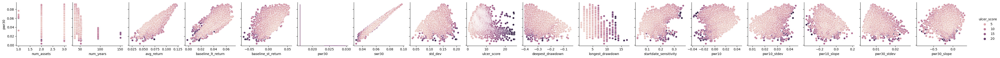

In [66]:
# tighten: deepest_drawdown
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
    AND ulcer_score < 25
    AND deepest_drawdown > -0.4
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

2655


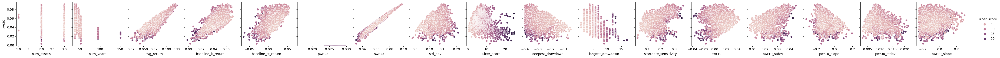

In [67]:
# tighten: pwr30_slope
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
    AND ulcer_score < 25
    AND deepest_drawdown > -0.4
    AND pwr30_slope > -0.25
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

1719


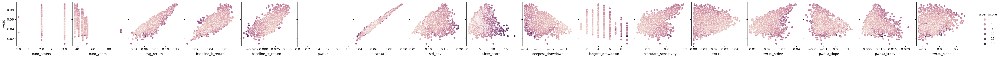

In [68]:
# tighten: pwr10
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
    AND ulcer_score < 25
    AND deepest_drawdown > -0.4
    AND pwr10 > 0
    AND pwr30_slope > -0.25
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

1702


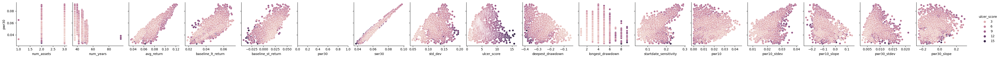

In [69]:
# tighten: pwr30
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
    AND ulcer_score < 25
    AND deepest_drawdown > -0.4
    AND pwr30 > 0.025
    AND pwr10 > 0
    AND pwr30_slope > -0.25
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

1351


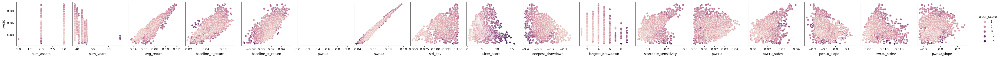

In [70]:
# tighten: std_dev
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
    AND pwr30 > 0.025
    AND pwr10 > 0
    AND std_dev < 0.15
    AND ulcer_score < 25
    AND deepest_drawdown > -0.4
    AND pwr30_slope > -0.25
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

1089


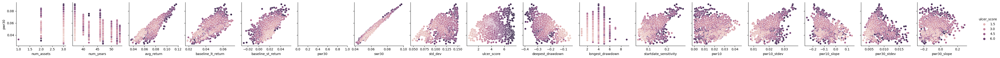

In [71]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 4
    AND pwr30 > 0.025
    AND pwr10 > 0
    AND std_dev < 0.15
    AND ulcer_score < 7.5
    AND deepest_drawdown > -0.4
    AND pwr30_slope > -0.25
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

12042


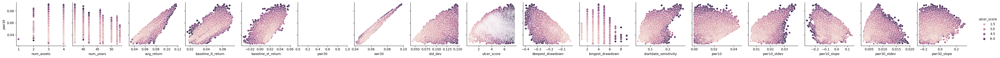

In [72]:
# expand to 4 assets
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 5
    AND pwr30 > 0.025
    AND pwr10 > 0
    AND std_dev < 0.15
    AND ulcer_score < 7.5
    AND deepest_drawdown > -0.4
    AND pwr30_slope > -0.25
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

7192


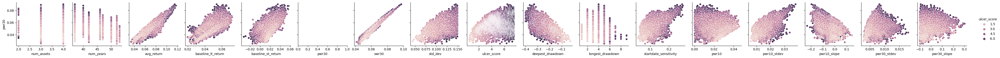

In [73]:
# tighten: pwr30_slope
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 5
    AND pwr30 > 0.025
    AND pwr10 > 0
    AND std_dev < 0.15
    AND ulcer_score < 7.5
    AND deepest_drawdown > -0.4
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

5929


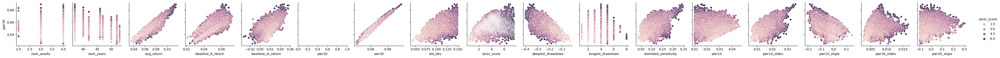

In [74]:
# tighten: pwr10
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 5
    AND pwr30 > 0.025
    AND pwr10 > 0.01
    AND std_dev < 0.15
    AND ulcer_score < 7.5
    AND deepest_drawdown > -0.4
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

4655


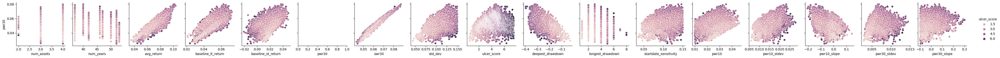

In [75]:
# tighten: startdate_sensitivity
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 5
    AND pwr30 > 0.025
    AND pwr10 > 0.01
    AND std_dev < 0.15
    AND ulcer_score < 7.5
    AND deepest_drawdown > -0.4
    AND startdate_sensitivity < 0.15
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

3526


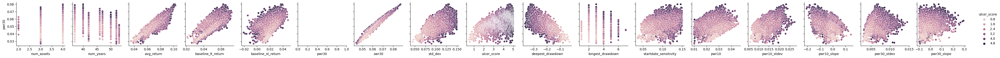

In [76]:
# tighten: ulcer_score
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 5
    AND pwr30 > 0.025
    AND pwr10 > 0.01
    AND std_dev < 0.15
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND startdate_sensitivity < 0.15
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

2091


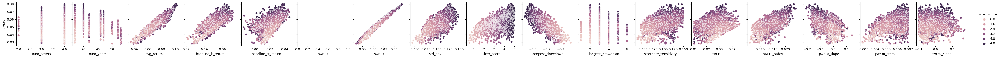

In [77]:
# tighten: pwr30_stdev
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 5
    AND pwr30 > 0.025
    AND pwr10 > 0.01
    AND std_dev < 0.15
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND startdate_sensitivity < 0.15
    AND pwr30_stdev < 0.007
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

3641


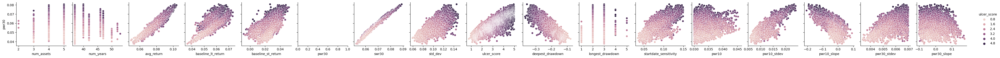

In [79]:
# tighten: pwr10, expand to 5 assets
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.025
    AND pwr10 > 0.03
    AND std_dev < 0.15
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND startdate_sensitivity < 0.15
    AND pwr30_stdev < 0.007
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

3591


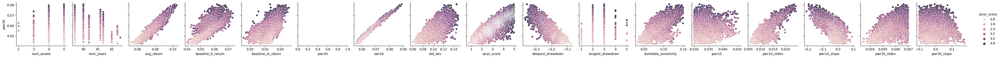

In [81]:
# tighten: pwr30
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.15
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND startdate_sensitivity < 0.15
    AND pwr30_stdev < 0.007
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

2499


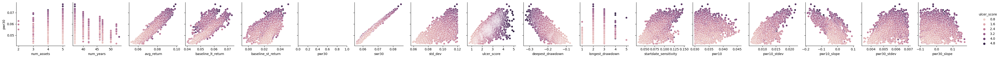

In [82]:
# tighten: std_dev
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND startdate_sensitivity < 0.15
    AND pwr30_stdev < 0.007
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

1862


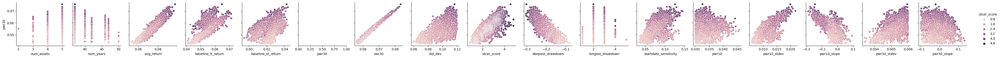

In [83]:
# tighten: pwr30_stdev
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND startdate_sensitivity < 0.15
    AND pwr30_stdev < 0.006
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

1012


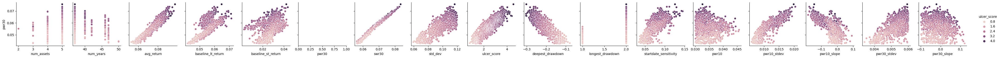

In [84]:
# tighten: longest_drawdown
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr30_stdev < 0.006
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

633


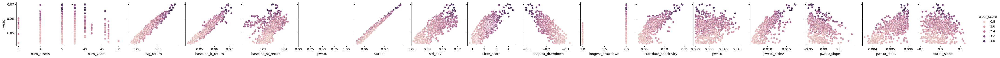

In [85]:
# tighten: pwr10_slope
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr10_slope > -0.05
    AND pwr30_stdev < 0.006
    AND pwr30_slope > -0.1
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

533


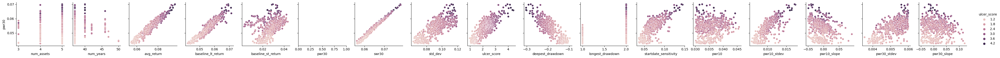

In [86]:
# tighten: pwr30_slope
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.4
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr10_slope > -0.05
    AND pwr30_stdev < 0.006
    AND pwr30_slope > -0.05
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

507


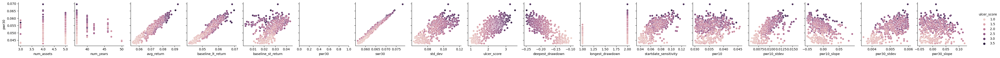

In [87]:
# tighten: deepest_drawdown
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.25
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr10_slope > -0.05
    AND pwr30_stdev < 0.006
    AND pwr30_slope > -0.05
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

190


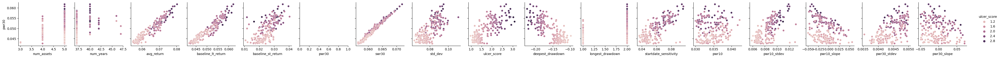

In [88]:
# tighten: pwr30_stdev
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.03
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.25
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr10_slope > -0.05
    AND pwr30_stdev < 0.005
    AND pwr30_slope > -0.05
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

80


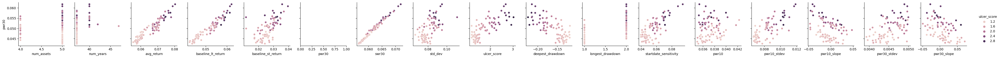

In [89]:
# tighten: pwr10
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.035
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.25
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr10_slope > -0.05
    AND pwr30_stdev < 0.005
    AND pwr30_slope > -0.05
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

67


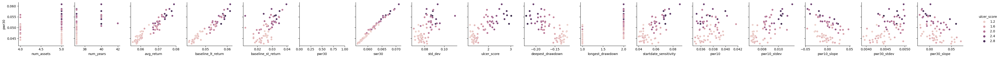

In [90]:
# tighten: pwr30_slope
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND pwr30 > 0.0425
    AND pwr10 > 0.035
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.25
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr10_slope > -0.05
    AND pwr30_stdev < 0.005
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')

53


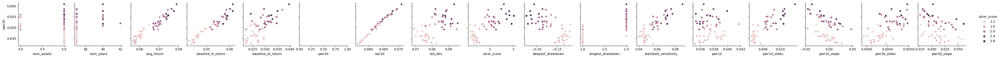

In [91]:
# tighten: baseline_st_return
df = query("""
  SELECT * FROM portfolios_no_bonds_no_active_funds
  WHERE num_assets < 6
    AND baseline_st_return > 0.022
    AND pwr30 > 0.0425
    AND pwr10 > 0.035
    AND std_dev < 0.12
    AND ulcer_score < 5
    AND deepest_drawdown > -0.25
    AND longest_drawdown < 3
    AND startdate_sensitivity < 0.15
    AND pwr10_slope > -0.05
    AND pwr30_stdev < 0.005
    AND pwr30_slope > -0.025
  ORDER BY ulcer_score DESC
""")
print(df['assets'].size)
sns.pairplot(df, y_vars=['pwr30'], x_vars=df.columns.values[1:], hue='ulcer_score')